<a href="https://colab.research.google.com/github/Kgau89/CustomerSegmentation/blob/main/Credit_Card_Transactions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Credit Card Transactions Analysis**

---




 Dataset obtained from https://www.kaggle.com/datasets/priyamchoksi/credit-card-transactions-dataset



1. Data Cleaning


*   Split the transaction date and time column
*   Removed 'unnamed' column
*   Introduced 'Age' column derived from dob









In [1]:
#import Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')


In [2]:
#Create dataframe
df = pd.read_csv('credit_card_transactions.csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,0,2019-01-01 00:00:18,2.703186e+15,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,-81.1781,3495.0,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1.325376e+09,36.011293,-82.048315,0.0,28705.0
1,1,2019-01-01 00:00:44,6.304233e+11,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,-118.2105,149.0,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1.325376e+09,49.159047,-118.186462,0.0,NaN
2,2,2019-01-01 00:00:51,3.885949e+13,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,-112.2620,4154.0,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1.325376e+09,43.150704,-112.154481,0.0,83236.0
3,3,2019-01-01 00:01:16,3.534094e+15,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,-112.1138,1939.0,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1.325376e+09,47.034331,-112.561071,0.0,NaN
4,4,2019-01-01 00:03:06,3.755342e+14,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,-79.4629,99.0,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1.325376e+09,38.674999,-78.632459,0.0,22844.0


Exploratory Data Analysis

In [3]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'merch_zipcode'],
      dtype='object')

In [4]:
#dropping personal info and unnamed column
df.drop(['Unnamed: 0','first', 'last'], axis=1, inplace=True)


In [5]:
#Separate transaction date & time
df[['transaction_date', 'transaction_time']] = df['trans_date_trans_time'].str.split(' ', expand=True)
df.drop('trans_date_trans_time', axis=1, inplace=True)
df.head(2)

,cc_num,merchant,category,amt,gender,street,city,state,zip,lat,...,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,transaction_date,transaction_time
0,2.703186e+15,"fraud_Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654.0,36.0788,...,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1.325376e+09,36.011293,-82.048315,0.0,28705.0,2019-01-01,00:00:18
1,6.304233e+11,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160.0,48.8878,...,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1.325376e+09,49.159047,-118.186462,0.0,NaN,2019-01-01,00:00:44


In [6]:
#Check null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131042 entries, 0 to 131041
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   cc_num            131041 non-null  float64
 1   merchant          131041 non-null  object 
 2   category          131041 non-null  object 
 3   amt               131041 non-null  float64
 4   gender            131041 non-null  object 
 5   street            131041 non-null  object 
 6   city              131041 non-null  object 
 7   state             131041 non-null  object 
 8   zip               131041 non-null  float64
 9   lat               131041 non-null  float64
 10  long              131041 non-null  float64
 11  city_pop          131041 non-null  float64
 12  job               131041 non-null  object 
 13  dob               131041 non-null  object 
 14  trans_num         131041 non-null  object 
 15  unix_time         131041 non-null  float64
 16  merch_lat         13

In [7]:
#Add Age column using DOB
from datetime import datetime

df['dob'] = pd.to_datetime(df['dob'])

#Get the current date
today = datetime.today()

#Calculate the age
df['age'] = (today - df['dob']).dt.days // 365  #floor division to get age in whole years

#Drop the 'dob' column
df.drop('dob', axis=1, inplace=True)
df.head(2)

,cc_num,merchant,category,amt,gender,street,city,state,zip,lat,...,job,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,transaction_date,transaction_time,age
0,2.703186e+15,"fraud_Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654.0,36.0788,...,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1.325376e+09,36.011293,-82.048315,0.0,28705.0,2019-01-01,00:00:18,36.0
1,6.304233e+11,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160.0,48.8878,...,Special educational needs teacher,1f76529f8574734946361c461b024d99,1.325376e+09,49.159047,-118.186462,0.0,NaN,2019-01-01,00:00:44,46.0


2. **EDA Summary**

*   **City_pop skeweness (Positively-skewed):**The density plot that the distribution is heavily concentrated towards the left of the mean.
The long tail extending towards the right indicates that there are fewer cities with larger populations. This means most of the data points (cities) have a small population, while only a few cities have a significantly larger population.This is also shown by the boxenplot.

*  ** Amount:** The same distribution also applies to Amount, which is also positively skewed. The tail extending towards the right indicates that there are significantly fewer transactions with higher amounts, suggesting that most transactions involve smaller amounts, while a small number of transactions involve much larger amounts. The box plot indicates that the amt variable has a wide range of values, with a concentration of smaller transactions and a few larger outliers.

*   **Age Density Plot:** Shows 2 distincts peaks, the first peak occurs around 40, and the second, slightly lower peak, occurs around 50. This indicates that these are the most common ages among the customers in the dataset.
The distribution appears to be relatively symmetric, however, the longer tail extending to the right suggests that while the majority of customers are middle-aged, there is still a substantial number of older customers, extending well into the 70s and beyond. The box plot indicates that the age variable has a relatively normal distribution, with a slight concentration of older individuals and a few outliers.

**Bar Graphs**


*   Category Count Plot: The categories "gas_transport" and "grocery_pos" have the highest number of transactions, indicating that these are the most common spending categories. Less frequent categoriescaterogies such as "travel," "misc_net," and "grocery_net" have significantly fewer transactions.
*   Transaction Amount vs Category:  "grocery_pos" has the highest total spending, indicating that it is the most expensive category. Lower spending categoriessuch as "grocery_net," "personal_care," and "travel" have significantly lower total spending, suggesting that they are less expensive categories.
*   The Transaction amount vs category by gender compares spending habits between females (F) and males (M) across various categories.
Home: Both genders spend the most here, with males slightly outspending females.
Entertainment, Health & Fitness, Kids & Pets: Females tend to spend more in these categories.
Gas & Transport, Miscellaneous: Males generally spend more in these areas.
Grocery, Shopping: Spending is fairly balanced between genders, with slight variations in specific subcategories.
*   Transactions by State: There is a notable difference in amounts across the states.

**Scatterplot**

Shows the relationship between amount (amt) and age.
*   Most data points are clustered around lower amounts (below 2000) and ages between 20 and 60.
*   As the amount increases, there are fewer data points, indicating fewer occurrences of higher amounts across all age groups.
*   Lower amounts are represented across a wide range of ages, but higher amounts are less frequent and spread out.

The scatterplot suggests that higher amounts are less common and not concentrated in any specific age group




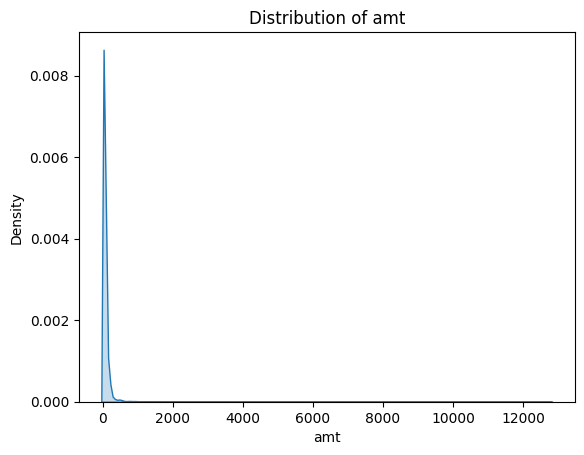

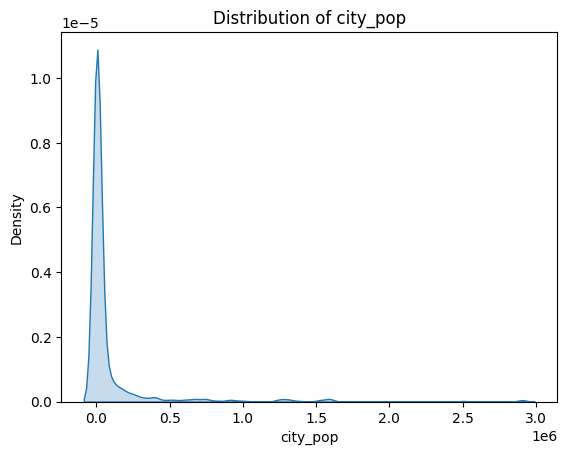

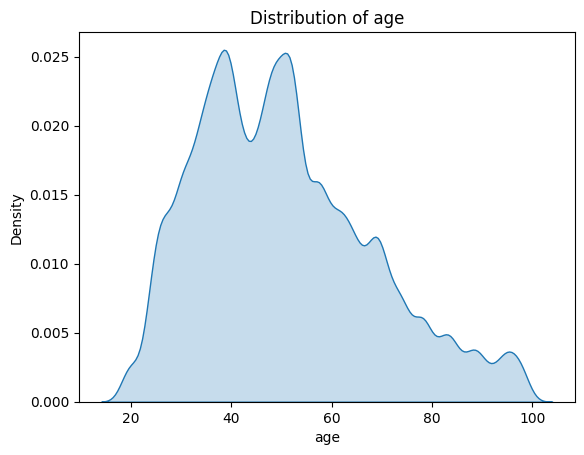

In [8]:
#Distribution of amount, city population and age
columns = ['amt', 'city_pop','age' ]
for i in columns:
  sns.kdeplot(df[i],shade=True,)
  plt.title(f'Distribution of {i}')
  plt.show()

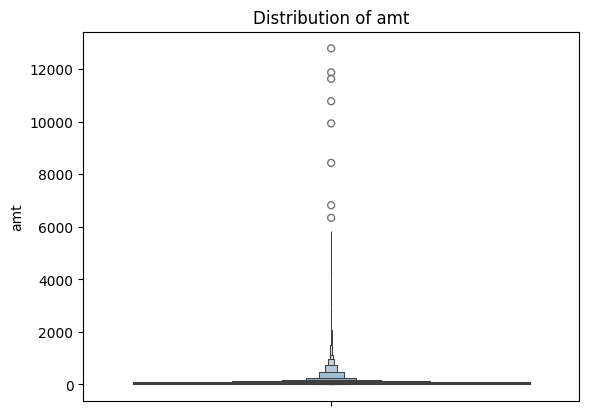

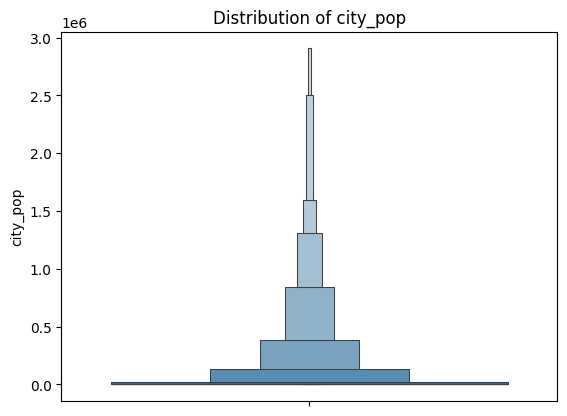

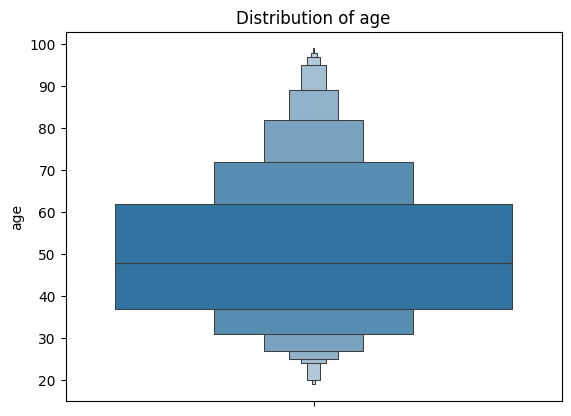

In [9]:
columns = ['amt', 'city_pop','age' ]
for i in columns:
  sns.boxenplot(df[i])
  plt.title(f'Distribution of {i}')
  plt.show()

In [10]:
#Set seaborn theme
sns.set_theme(style='darkgrid')

<function matplotlib.pyplot.show(close=None, block=None)>

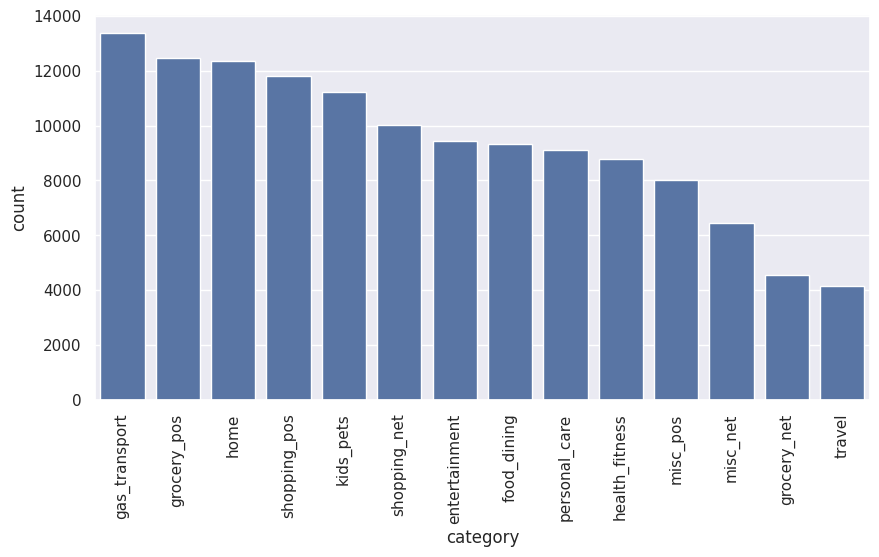

In [11]:
#Generate countplot of 'category' in descending order
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='category', order=df['category'].value_counts().index)
plt.xticks(rotation=90)
plt.show

Most customers used credit card to purchase gas_transport

<function matplotlib.pyplot.show(close=None, block=None)>

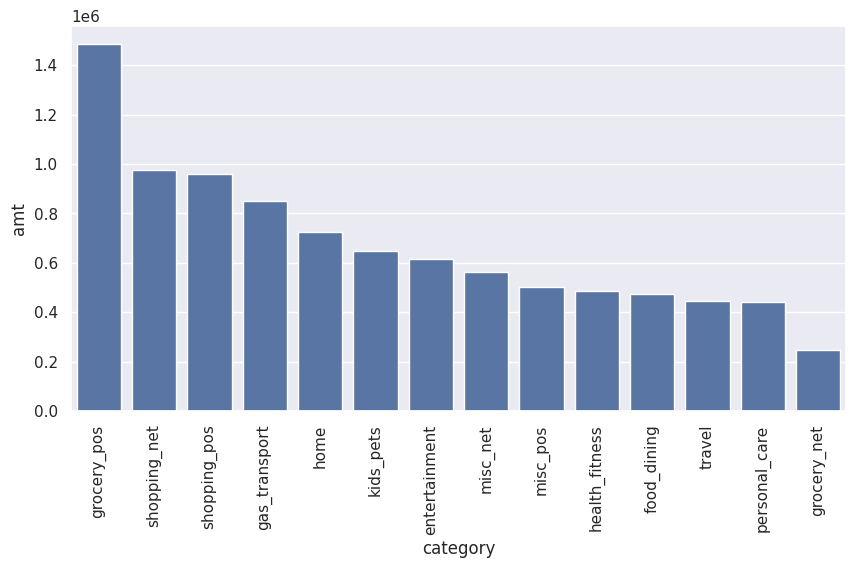

In [12]:
#Show barplot of total transactions by category in descending order
plt.figure(figsize=(10,5))
sorted_df = df.groupby('category')['amt'].sum().reset_index().sort_values(by='amt', ascending=False) #Sort by the 'amt' column
sns.barplot(x='category', y='amt', data= sorted_df) #Use the sorted DataFrame
plt.xticks(rotation=90)
plt.show

Customers spent the most on grocery_pos

<function matplotlib.pyplot.show(close=None, block=None)>

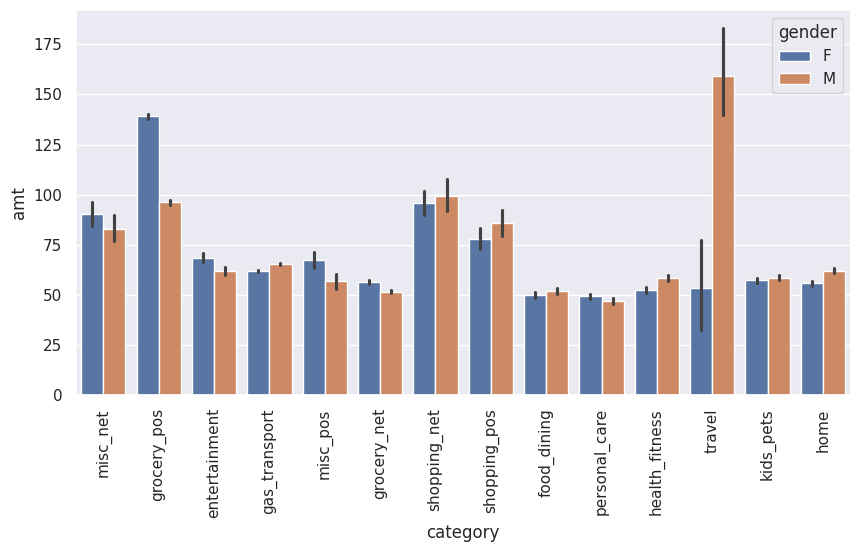

In [13]:
#Visualise total transactions by category with gender hue
plt.figure(figsize=(10,5))
sns.barplot(x='category', y='amt', hue='gender', data=df)
plt.xticks(rotation=90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

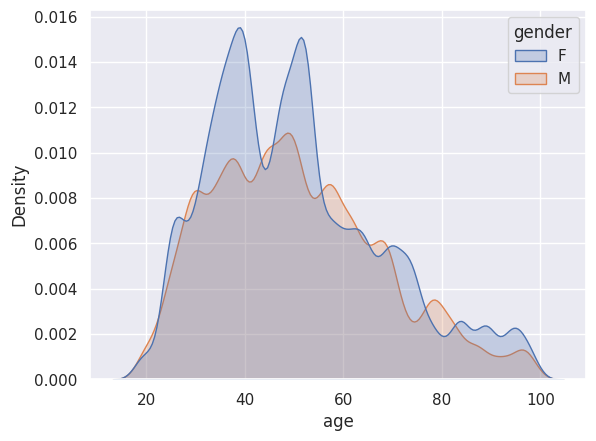

In [14]:
#kde plot showing age distribution in comparison to gender
sns.kdeplot(data=df, x='age', hue='gender', fill=True)
plt.show

In [15]:
df['gender'].value_counts(normalize=True)

,proportion
gender,
F,0.54634
M,0.45366


<function matplotlib.pyplot.show(close=None, block=None)>

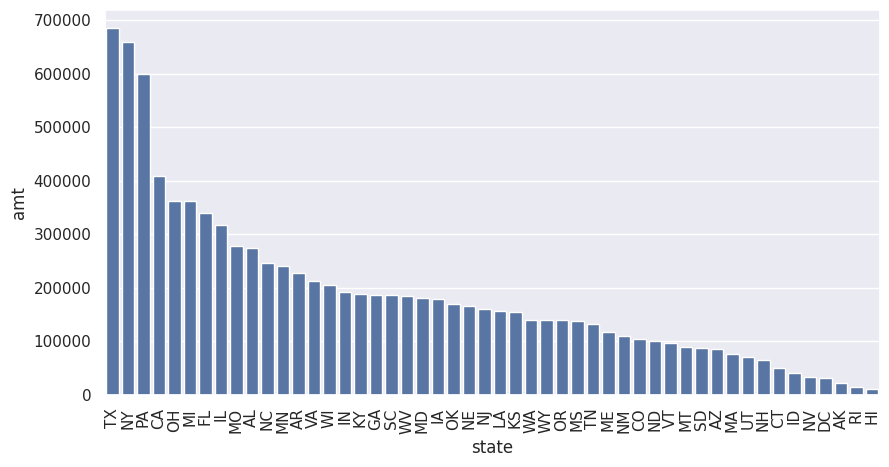

In [16]:
#Show barplot of total transactions by state in descending order
plt.figure(figsize=(10,5))
sorted_df = df.groupby('state')['amt'].sum().reset_index().sort_values(by='amt', ascending=False) #Sort by the 'amt' column
sns.barplot(x='state', y='amt', data= sorted_df) #Use the sorted DataFrame
plt.xticks(rotation=90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

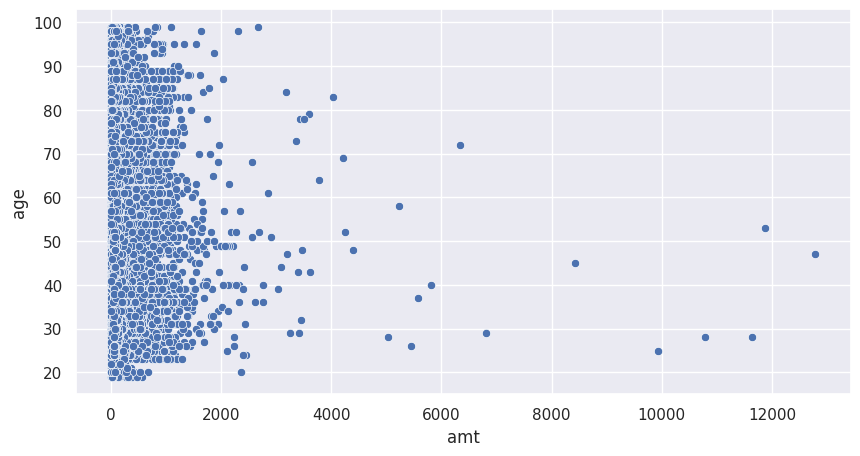

In [17]:
#show scatterplot of age and amt
plt.figure(figsize=(10,5))
sns.scatterplot(x='amt', y='age', data=df)
plt.show

**3. Multivariate Clustering**

In [19]:
#Create dataframe for clustering
cluster_df = df[['age', 'amt', 'cc_num', 'city_pop']]
cluster_df.set_index('cc_num', inplace=True)
cluster_df.head(2)

,age,amt,city_pop
cc_num,,,
2.703186e+15,36.0,4.97,3495.0
6.304233e+11,46.0,107.23,149.0


In [20]:
#Scaling the data for improved model performance, better handling of outliers and better interpretability
scaler = StandardScaler()
scaled_data = scaler.fit_transform(cluster_df)

In [21]:
scaled_data

array([[-0.8323158 , -0.44014539, -0.28457879],
       [-0.25853033,  0.23306691, -0.29563991],
       [ 0.65952642,  0.97619427, -0.28240029],
       ...,
       [ 0.60214788, -0.1381676 ,  2.4863725 ],
       [ 0.48739078,  0.22865607, -0.29347463],
       [        nan,         nan,         nan]])

In [22]:
#Create new dataframe from scaled data
scaled_df = pd.DataFrame(scaled_data, columns=cluster_df.columns, index=cluster_df.index)
scaled_df.head(2)

,age,amt,city_pop
cc_num,,,
2.703186e+15,-0.832316,-0.440145,-0.284579
6.304233e+11,-0.258530,0.233067,-0.295640


In [23]:
#Create a function to find the optimum number of clusters
def optimise_k_means(data, max_k):
    means = []
    inertias = []
    data = data.dropna()

    for i in range (1, max_k):
        kmeans = KMeans(n_clusters=i)
        kmeans.fit(data)

        means.append(i)
        inertias.append(kmeans.inertia_)

    #elbow plot
    fig = plt.subplots(figsize=(10, 5))
    plt.plot(means, inertias, 'o-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

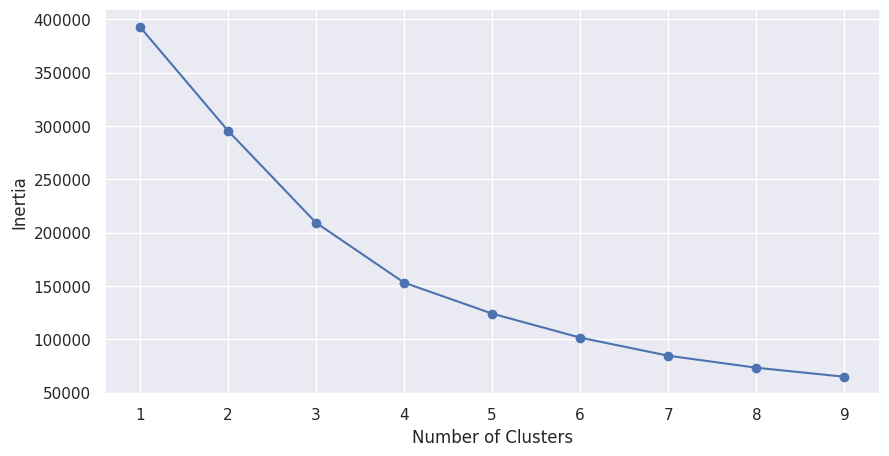

In [24]:
#Call the function, indicating a max of 10 clusters
optimise_k_means(scaled_df, 10)

Optimal number of clusters = 3

In [25]:
#Fit the kmeans dataframe, specifying optimal clusters
k_means = KMeans(n_clusters=3)
scaled_df_dropna = scaled_df.dropna()
k_means.fit(scaled_df_dropna)

KMeans(n_clusters=3)

In [26]:
#Create a new column for the clusters
scaled_df_dropna['kmeans_3'] = k_means.labels_
scaled_df_dropna.head()

,age,amt,city_pop,kmeans_3
cc_num,,,,
2.703186e+15,-0.832316,-0.440145,-0.284579,2
6.304233e+11,-0.258530,0.233067,-0.295640,2
3.885949e+13,0.659526,0.976194,-0.282400,1
3.534094e+15,0.372634,-0.176614,-0.289723,1
3.755342e+14,-0.717559,-0.196628,-0.295805,2


In [27]:
import plotly.express as px

#Calculate absolute values for marker sizes
size_values = scaled_df_dropna['amt'].abs()

fig = px.scatter_3d(scaled_df_dropna, x='amt', y='city_pop', z='age',
              color='kmeans_3', size=size_values, opacity=0.4)  # Use absolute values for size
fig.show()

In [33]:
#percentage distribution in each cluster
scaled_df_dropna['kmeans_3'].value_counts(normalize=True)

,proportion
kmeans_3,
2,0.631177
1,0.332194
0,0.036630


**4. Conclusion**

Cluster 0 (Purple): 4% in size, characterised by younger customers making smaller to moderate transactions, present across various city sizes but more concentrated in larger areas.
Cluster 1 (Red): 33% in size, represents middle-aged to older customers with low to moderate transactions, predominantly in medium to larger city populations.
Cluster 2 (Yellow): 63% in size, represents older customers with higher transactions and potentially lower spending needs.

Future Analysis: Customer lifetime value (CLV) of each cluster  to help identify which segments are most valuable to the bank.